In [104]:
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
from pandas_profiling import ProfileReport
from sklearn.cross_decomposition import CCA
from sklearn.linear_model import LinearRegression
from sklearn.decomposition import PCA

np.random.seed(57)

%matplotlib inline

# データの読み込み

In [2]:
df_scores = pd.read_csv(os.path.join('..', 'data', '12_subject_scores.csv'))

display(df_scores.head())

display(df_scores.describe())

,国語,英語,数学,物理,化学,生物,地学,世界史,日本史,経済,地理,倫理
0,-0.394296,-0.863552,0.299784,0.052264,-0.193747,1.762086,-0.458840,-0.889665,-0.163093,-0.939310,-0.149300,-2.286900
1,-1.062188,-0.061273,-0.572619,-0.544283,-0.305108,1.988985,-0.166363,0.610966,-0.951714,1.390854,-0.226003,-0.031098
2,-0.669470,-0.751437,0.574793,-0.379771,-0.539259,-0.623499,-1.034320,0.393436,1.439274,2.218160,0.716289,-0.462702
3,0.776026,1.166164,-0.986413,-0.723857,-0.091960,-0.150870,-0.047286,-2.427921,0.433994,-1.270779,0.323981,1.406393
4,-2.212173,-0.571762,-0.842556,-0.849638,-0.280362,-1.089733,-0.836957,-0.812882,-1.702264,-0.365675,-0.113076,-2.497812


,国語,英語,数学,物理,化学,生物,地学,世界史,日本史,経済,地理,倫理
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,-0.010089,-0.042211,-0.003682,-0.051710,-0.006481,-0.036420,-0.022611,-0.041581,-0.053731,0.014815,-0.008568,-0.033251
std,0.995078,1.016360,0.999122,0.977206,1.025088,1.039087,1.029798,0.990281,1.009654,0.988610,0.982288,1.050754
min,-3.416756,-3.155252,-3.080833,-2.931218,-3.098775,-3.282151,-2.878050,-3.661941,-3.183342,-2.912544,-2.941501,-3.253023
25%,-0.700112,-0.714549,-0.675039,-0.708696,-0.718682,-0.759295,-0.742097,-0.713674,-0.761428,-0.669257,-0.693002,-0.774409
50%,0.014930,0.010007,0.002503,-0.048876,-0.040991,0.006117,-0.012499,-0.051340,-0.018274,0.019602,0.003966,-0.065331
75%,0.674855,0.636507,0.608149,0.600204,0.682366,0.656197,0.685734,0.651264,0.633814,0.667424,0.636094,0.660389
max,3.098545,2.769637,3.718981,3.092036,3.295149,3.023081,2.991380,2.850458,3.051229,3.296786,3.522907,2.961954


# See profile

In [3]:
profile = ProfileReport(df_scores, title='Pandas Profiling Report', html={'style':{'full_width':True}})

In [4]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Canonical Correlation Analysis

In [18]:
n_components = 3

cca = CCA(n_components=n_components)

lst_col_science = ['数学', '物理', '化学', '生物', '地学']
lst_col_literature = ['国語', '英語', '世界史', '日本史', '経済', '地理', '倫理']

cca.fit(df_scores[lst_col_science], df_scores[lst_col_literature])

CCA(n_components=3)

In [20]:
display(pd.DataFrame(cca.x_weights_, index=lst_col_science, columns=['comp_{}'.format(i) for i in range(n_components)]))
display(pd.DataFrame(cca.y_weights_, index=lst_col_literature, columns=['comp_{}'.format(i) for i in range(n_components)]))

,comp_0,comp_1,comp_2
数学,0.075378,0.217956,-0.359437
物理,0.120851,0.694803,0.597896
化学,-0.049130,0.681606,-0.482971
生物,0.739818,-0.066579,0.295814
地学,0.655720,-0.026922,-0.438815


,comp_0,comp_1,comp_2
国語,0.142816,0.800616,0.051234
英語,0.175277,0.365876,-0.201596
世界史,0.111300,0.000167,-0.057080
日本史,-0.056381,-0.108432,-0.604378
経済,0.547782,-0.434046,0.274561
地理,-0.046217,0.139171,0.700614
倫理,0.794426,0.075013,-0.148187


In [21]:
cca.x_weights_

array([[ 0.07537794,  0.21795647, -0.35943691],
       [ 0.12085085,  0.6948025 ,  0.59789567],
       [-0.04912978,  0.68160613, -0.48297148],
       [ 0.73981776, -0.06657911,  0.29581445],
       [ 0.65572035, -0.02692157, -0.43881458]])

# Common component extraction

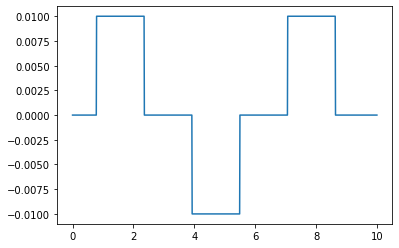

In [143]:
n_bin = 1001
coef_signal = 0.01
coef_noise = 1
coef_noise_2 = 1e-4
p_noise_rate = 0.7
q_noise_rate = -0.4

x = np.linspace(0, 10, n_bin)

y = coef_signal * ((np.sin(x) > 1/np.sqrt(2)).astype(int) - (np.sin(x) < -1/np.sqrt(2)).astype(int))

plt.plot(x, y)

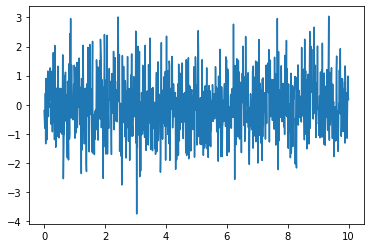

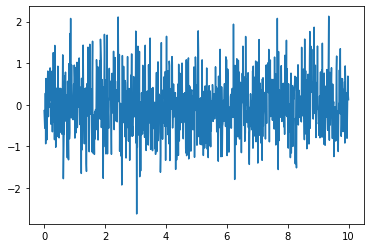

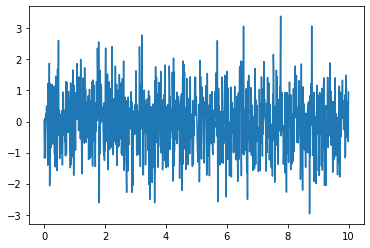

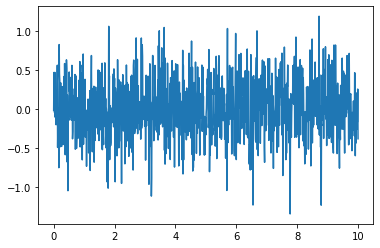

In [144]:


p_noise = np.random.randn(n_bin)
p1 = y + coef_noise * p_noise + coef_noise_2 * np.random.randn(n_bin)
p2 = y + p_noise_rate * coef_noise * p_noise + coef_noise_2 * np.random.randn(n_bin)
p = np.concatenate([p1.reshape(-1, 1), p2.reshape(-1, 1)], axis=1)

q_noise = np.random.randn(n_bin)
q1 = y + coef_noise * q_noise + coef_noise_2 * np.random.randn(n_bin)
q2 = y + q_noise_rate * coef_noise * q_noise + coef_noise_2 * np.random.randn(n_bin)
q = np.concatenate([q1.reshape(-1, 1), q2.reshape(-1, 1)], axis=1)

plt.plot(x, p1)
plt.show()
plt.plot(x, p2)
plt.show()
plt.plot(x, q1)
plt.show()
plt.plot(x, q2)
plt.show()

In [145]:
cca = CCA(n_components=1)

cca.fit(p, q)

CCA(n_components=1)

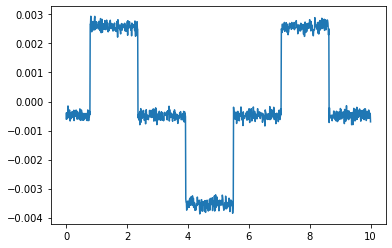

In [146]:
plt.plot(x, cca.transform(p))

In [147]:
lm = LinearRegression()

lm.fit(p, q)

LinearRegression()

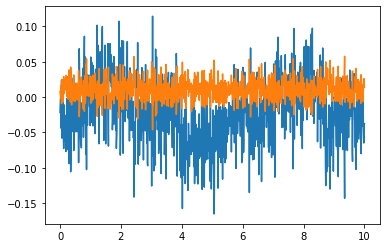

In [148]:
plt.plot(x, lm.predict(p))

In [149]:
pca_1 = PCA(n_components=1)
pca_2 = PCA(n_components=1)

pca_1.fit(p)
pca_2.fit(np.concatenate([p, q], axis=1))

PCA(n_components=1)

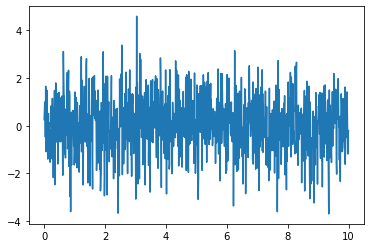

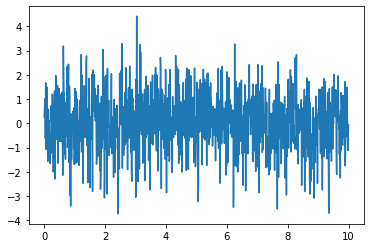

In [150]:
plt.plot(x, pca_1.transform(p))
plt.show()
plt.plot(x, pca_2.transform(np.concatenate([p, q], axis=1)))